In [1]:
import pandas as pd
import numpy as np

In [2]:
train_data= pd.read_csv("Train_data_liv_tox_14256.csv")
train_data = train_data[~train_data.Source_rank.isin([2, 4, 9, 10, 12])].reset_index(drop=True)
train_data

,smiles_r,TOXICITY,Source_rank,Source,Data,InChIKey,InChIKey14,protonated_smiles_r,Mfp0,Mfp1,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,CN(Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,ABJKWBDEJIDSJZ-UHFFFAOYSA-N,ABJKWBDEJIDSJZ,C[NH+](Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,0,0,...,0.000000,10.085517,58.622510,318.221626,6.119647,1498.0,36.0,126.0,145.0,5.138889
1,COc1cc2c(cc1OC)CC(=O)N(CCCN(C)CC1Cc3cc(OC)c(OC...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,ACRHBAYQBXXRTO-UHFFFAOYSA-N,ACRHBAYQBXXRTO,COc1cc2c(cc1OC)CC(=O)[NH+](CCC[NH+](C)CC1Cc3cc...,0,0,...,5.293305,10.572726,78.667003,470.276975,6.531625,4157.0,58.0,178.0,212.0,7.750000
2,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,AEQGYUJKXATLBW-UHFFFAOYSA-N,AEQGYUJKXATLBW,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,0,0,...,7.247793,10.915325,85.019190,458.266839,6.454463,3111.0,67.0,190.0,235.0,6.729167
3,CNc1ccccc1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,AFBPFSWMIHJQDM-UHFFFAOYSA-N,AFBPFSWMIHJQDM,CNc1ccccc1,0,0,...,0.000000,8.298291,35.247635,107.073499,6.298441,64.0,7.0,34.0,36.0,2.000000
4,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2N1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,AGMMTXLNIQSRCG-UHFFFAOYSA-N,AGMMTXLNIQSRCG,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2[NH2+]1,0,0,...,0.000000,9.994653,51.598416,290.036066,9.356002,567.0,30.0,96.0,113.0,3.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12128,CC(C)C(Oc1ccc(CNC(=O)C2CCN(C(=O)CC(N)Cc3c(F)c(...,0,16,Reactive Metabolite Mazzolari et al,LivTox,ZFLVPOVMZBOEHJ-UHFFFAOYSA-N,ZFLVPOVMZBOEHJ,CC(C)C(Oc1ccc(CNC(=O)C2CC[NH+](C(=O)CC([NH3+])...,0,1,...,6.605298,10.533029,90.548061,572.217839,8.059406,6887.0,65.0,204.0,238.0,8.777778
12129,O=C1CC(c2ccc(O)cc2)Oc2ccccc21,0,16,Reactive Metabolite Mazzolari et al,LivTox,ZLHVIYHWWQYJID-UHFFFAOYSA-N,ZLHVIYHWWQYJID,O=C1CC(c2ccc(O)cc2)Oc2ccccc21,0,0,...,0.000000,9.860110,51.351894,240.078644,8.002621,598.0,28.0,96.0,113.0,3.916667
12130,CCCCSP(=O)(SCCCC)SCCCC,0,16,Reactive Metabolite Mazzolari et al,LivTox,ZOKXUAHZSKEQSS-UHFFFAOYSA-N,ZOKXUAHZSKEQSS,CCCCSP(=O)(SCCCC)SCCCC,0,0,...,0.000000,8.981304,47.595574,314.096165,7.138549,616.0,18.0,68.0,70.0,4.375000
12131,O=C1CC(c2ccccc2)Oc2ccccc21,0,16,Reactive Metabolite Mazzolari et al,LivTox,ZONYXWQDUYMKFB-UHFFFAOYSA-N,ZONYXWQDUYMKFB,O=C1CC(c2ccccc2)Oc2ccccc21,0,0,...,0.000000,9.786336,50.012654,224.083730,7.727025,500.0,26.0,90.0,106.0,3.750000


In [3]:
train_data.iloc[:, :5]

,smiles_r,TOXICITY,Source_rank,Source,Data
0,CN(Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox
1,COc1cc2c(cc1OC)CC(=O)N(CCCN(C)CC1Cc3cc(OC)c(OC...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox
2,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox
3,CNc1ccccc1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox
4,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2N1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox
...,...,...,...,...,...
12128,CC(C)C(Oc1ccc(CNC(=O)C2CCN(C(=O)CC(N)Cc3c(F)c(...,0,16,Reactive Metabolite Mazzolari et al,LivTox
12129,O=C1CC(c2ccc(O)cc2)Oc2ccccc21,0,16,Reactive Metabolite Mazzolari et al,LivTox
12130,CCCCSP(=O)(SCCCC)SCCCC,0,16,Reactive Metabolite Mazzolari et al,LivTox
12131,O=C1CC(c2ccccc2)Oc2ccccc21,0,16,Reactive Metabolite Mazzolari et al,LivTox


In [4]:
train_data.iloc[:, :5].to_csv("proxy-DILI dataset.csv", index=False)

In [5]:
train_data.Source_rank.value_counts()

15    5239
7     2204
3     1163
8     1106
6      671
5      542
14     446
11     445
16     317
Name: Source_rank, dtype: int64

In [6]:
test_data_ncv= pd.read_csv("test_data_ncv_DILIst_888.csv")
test_data_heldouttest= pd.read_csv("test_data_heldouttest_DILIst_223.csv")

In [7]:
test_data_ncv["DILI"]="NCV"
test_data_heldouttest["DILI"]="Held-out"

In [8]:
df = pd.concat([train_data, test_data_ncv, test_data_heldouttest])
df=df[["smiles_r", "TOXICITY", "Source_rank", "Source", "Data", "DILI"]].reset_index(drop=True)
df

,smiles_r,TOXICITY,Source_rank,Source,Data,DILI
0,CN(Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN
1,COc1cc2c(cc1OC)CC(=O)N(CCCN(C)CC1Cc3cc(OC)c(OC...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN
2,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN
3,CNc1ccccc1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN
4,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2N1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN
...,...,...,...,...,...,...
13239,ClC1C(Cl)C(Cl)C(Cl)C(Cl)C1Cl,0,1,DILIst Classification Topical,DILI,Held-out
13240,Oc1c(C2=CCC(c3ccc(Cl)cc3)CC2)c(O)c2ccccc2c1O,0,1,DILIst Classification Oral,DILI,Held-out
13241,C=Cc1ccc(S(=O)(=O)O)cc1,0,1,DILIst Classification Oral,DILI,Held-out
13242,OCC(O)c1oc(O)c(O)c1O,0,1,DILIst Classification Intravenous,DILI,Held-out


In [9]:
df.to_csv("datawarrioranalysis_allcompounds_13244.csv", index=False)

In [10]:
for i in df.Data.unique():
    print(i)
    print(df[df["Data"]==i]["TOXICITY"].value_counts())

LivTox
0    7750
1    4383
Name: TOXICITY, dtype: int64
DILI
1    716
0    395
Name: TOXICITY, dtype: int64


In [11]:
for i in df.Source_rank.unique():
    print(i)
    print(df[df["Source_rank"]==i]["TOXICITY"].value_counts())

3
1    588
0    575
Name: TOXICITY, dtype: int64
5
0    358
1    184
Name: TOXICITY, dtype: int64
6
1    369
0    302
Name: TOXICITY, dtype: int64
7
1    1642
0     562
Name: TOXICITY, dtype: int64
8
0    724
1    382
Name: TOXICITY, dtype: int64
11
0    237
1    208
Name: TOXICITY, dtype: int64
14
1    240
0    206
Name: TOXICITY, dtype: int64
15
0    4550
1     689
Name: TOXICITY, dtype: int64
16
0    236
1     81
Name: TOXICITY, dtype: int64
1
1    619
0    371
Name: TOXICITY, dtype: int64
13
1    97
0    24
Name: TOXICITY, dtype: int64


In [13]:
from rdkit import Chem, DataStructs
from rdkit.Chem import Descriptors,Crippen

def GetExactMolWt(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.ExactMolWt (mol))
def GetCalcTPSA(s):
    mol = Chem.MolFromSmiles(s)
    return (Chem.rdMolDescriptors.CalcTPSA(mol))
def GetNumRotatableBonds(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumRotatableBonds (mol))
def GetNumHDonors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHDonors(mol))
def GetNumHAcceptors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHAcceptors(mol) )
def GetMolLogP(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.MolLogP(mol))

In [14]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=False)

INFO: Pandarallel will run on 112 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [15]:
df['MolWt']=df['smiles_r'].parallel_apply(GetExactMolWt)
df['TPSA']=df['smiles_r'].parallel_apply(GetCalcTPSA) #Topological Polar Surface Area
df['nRotB']=df['smiles_r'].parallel_apply(GetNumRotatableBonds) #Number of rotable bonds
df['HBD']=df['smiles_r'].parallel_apply(GetNumHDonors) #Number of H bond donors
df['HBA']=df['smiles_r'].parallel_apply(GetNumHAcceptors) #Number of H bond acceptors
df['LogP']=df['smiles_r'].parallel_apply(GetMolLogP) #LogP

In [16]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# data scaling

pca = PCA(n_components=2)

features_Std = StandardScaler().fit_transform(df[["MolWt",  "TPSA", "nRotB" , "HBD", "HBA", "LogP"]])
pca_res = pca.fit_transform(features_Std)

print('Shape before PCA: ', pca_res.shape)
print('Shape after PCA: ', pca_res.shape)

pca_df = pd.DataFrame(
    data=pca_res, 
    columns=['PC1', 'PC2'])

Shape before PCA:  (13244, 2)
Shape after PCA:  (13244, 2)


In [17]:
df['PC1'] = pca_df['PC1'] 
df['PC2'] = pca_df['PC2'] 

In [18]:
import numpy as np
pcv_1 = np.round(pca.explained_variance_ratio_[0], 4)*100
pcv_2 = np.round(pca.explained_variance_ratio_[1], 4)*100
print(pcv_1, pcv_2)

58.86 26.290000000000003


In [20]:
58.86 + 26.29

85.15

In [21]:
from sklearn.manifold import TSNE
tsne_res = TSNE(n_components=2, n_jobs=-1, verbose=2).fit_transform(features_Std)

tsne_df = pd.DataFrame(data=tsne_res, columns=['tsne_1', 'tsne_2'])

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13244 samples in 0.008s...
[t-SNE] Computed neighbors for 13244 samples in 0.412s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13244
[t-SNE] Computed conditional probabilities for sample 2000 / 13244
[t-SNE] Computed conditional probabilities for sample 3000 / 13244
[t-SNE] Computed conditional probabilities for sample 4000 / 13244
[t-SNE] Computed conditional probabilities for sample 5000 / 13244
[t-SNE] Computed conditional probabilities for sample 6000 / 13244
[t-SNE] Computed conditional probabilities for sample 7000 / 13244
[t-SNE] Computed conditional probabilities for sample 8000 / 13244
[t-SNE] Computed conditional probabilities for sample 9000 / 13244
[t-SNE] Computed conditional probabilities for sample 10000 / 13244
[t-SNE] Computed conditional probabilities for sample 11000 / 13244
[t-SNE] Computed conditional probabilities for sample 12000 / 13244
[t-SNE] Computed conditional probabilities for sam

In [22]:
df['tsne_1'] = tsne_df['tsne_1'] 
df['tsne_2'] = tsne_df['tsne_2'] 
df

,smiles_r,TOXICITY,Source_rank,Source,Data,DILI,MolWt,TPSA,nRotB,HBD,HBA,LogP,PC1,PC2,tsne_1,tsne_2
0,CN(Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN,317.214350,3.24,4,0,1,5.7693,-1.516772,1.418011,20.492050,-59.030979
1,COc1cc2c(cc1OC)CC(=O)N(CCCN(C)CC1Cc3cc(OC)c(OC...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN,468.262422,60.47,10,0,6,3.3100,0.725520,1.462177,7.754131,-12.622993
2,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN,458.266839,100.90,4,2,6,3.5447,1.079744,0.478367,29.547396,19.623018
3,CNc1ccccc1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN,107.073499,12.03,1,1,1,1.7283,-1.741754,-0.842726,-92.300819,19.262539
4,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2N1,1,3,"human hepatotoxicity, hepatobiallry, literaty...",LivTox,NaN,289.028790,101.29,2,3,4,0.8788,0.567576,-1.091842,37.820980,55.670822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13239,ClC1C(Cl)C(Cl)C(Cl)C(Cl)C1Cl,0,1,DILIst Classification Topical,DILI,Held-out,287.860066,0.00,0,0,0,3.6444,-1.929926,0.246965,24.702019,-76.591011
13240,Oc1c(C2=CCC(c3ccc(Cl)cc3)CC2)c(O)c2ccccc2c1O,0,1,DILIst Classification Oral,DILI,Held-out,366.102272,60.69,2,3,3,5.9611,-0.040100,0.811411,-31.280348,54.414948
13241,C=Cc1ccc(S(=O)(=O)O)cc1,0,1,DILIst Classification Oral,DILI,Held-out,184.019415,54.37,2,1,2,1.5763,-0.929952,-0.715839,-61.079903,34.349072
13242,OCC(O)c1oc(O)c(O)c1O,0,1,DILIst Classification Intravenous,DILI,Held-out,176.032088,114.29,2,5,6,-0.5779,1.229904,-2.134774,66.619820,49.039673


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

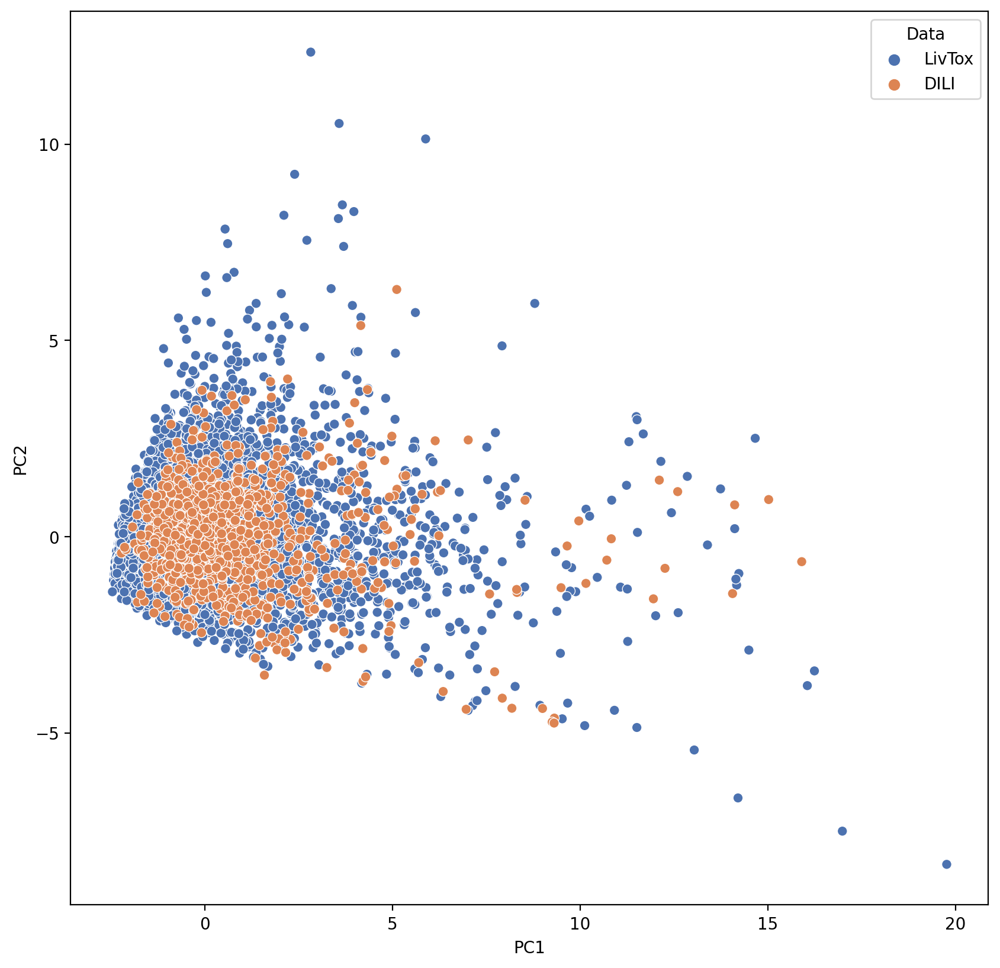

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Data", palette="deep")

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

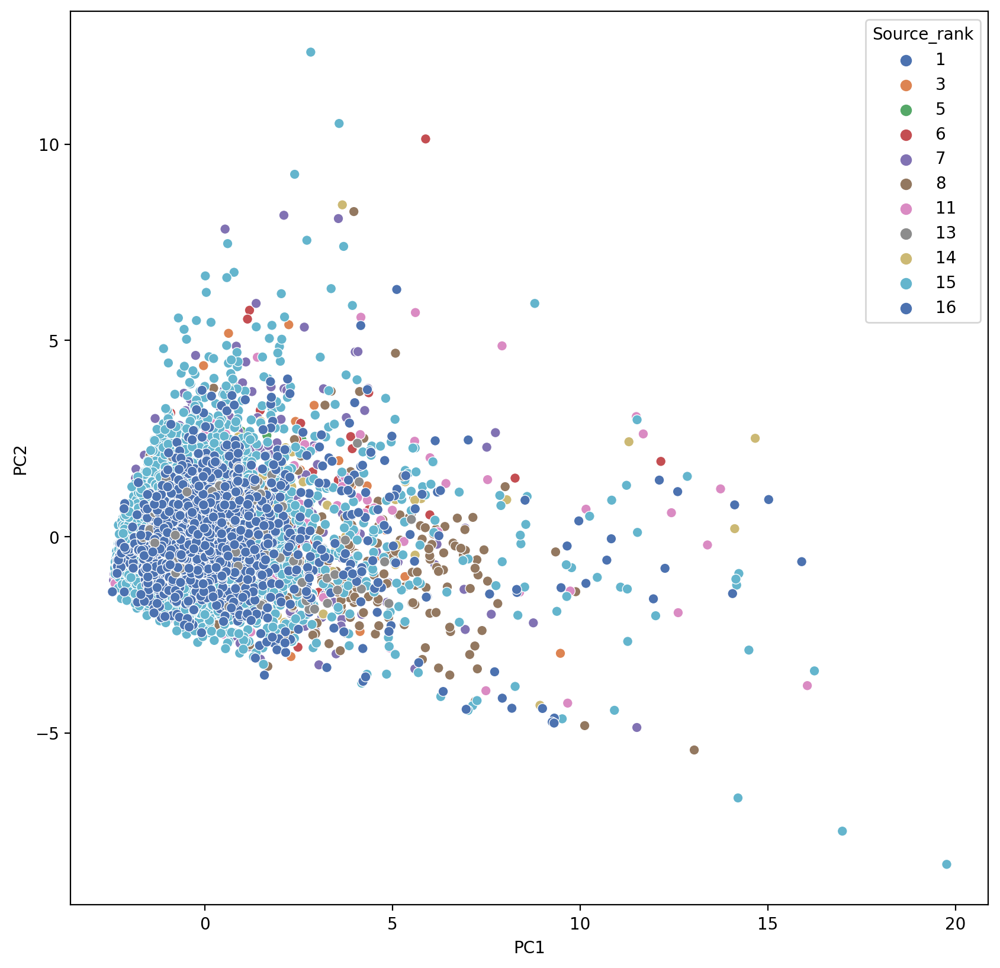

In [24]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Source_rank", palette="deep")

<AxesSubplot:xlabel='tsne_1', ylabel='tsne_2'>

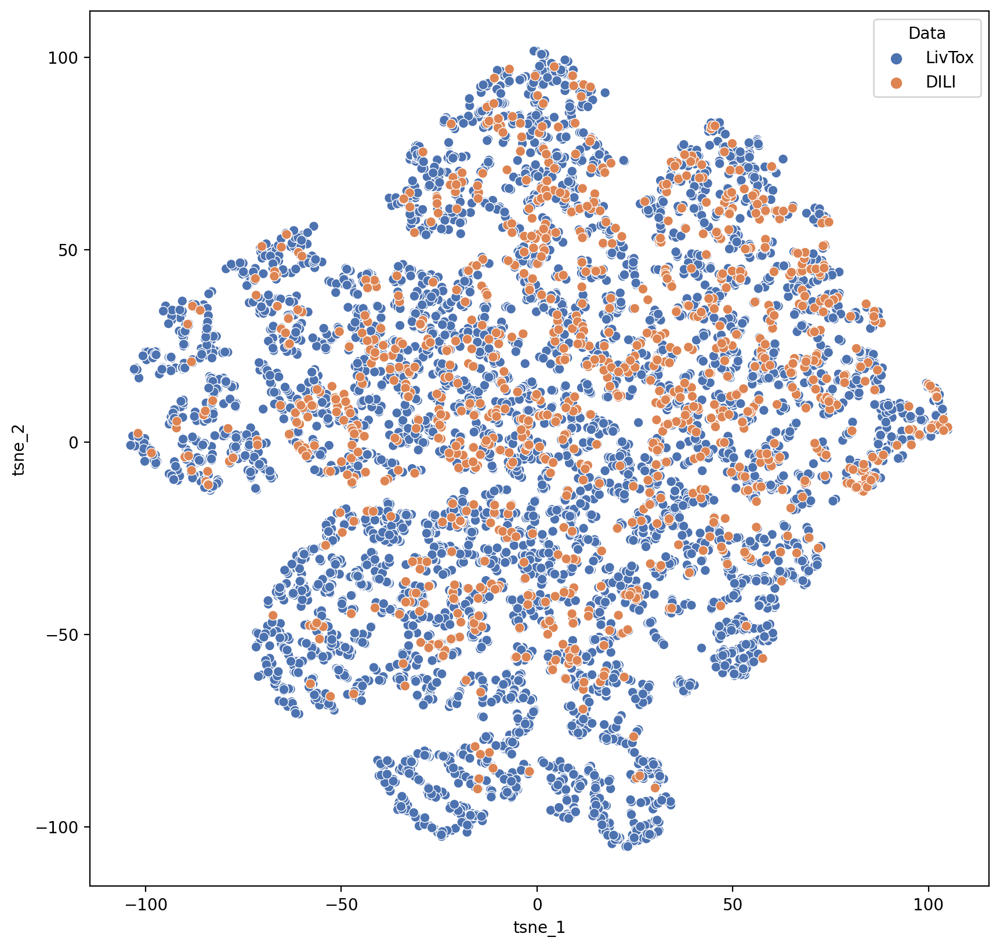

In [25]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", hue="Data", palette="deep")

<AxesSubplot:xlabel='tsne_1', ylabel='tsne_2'>

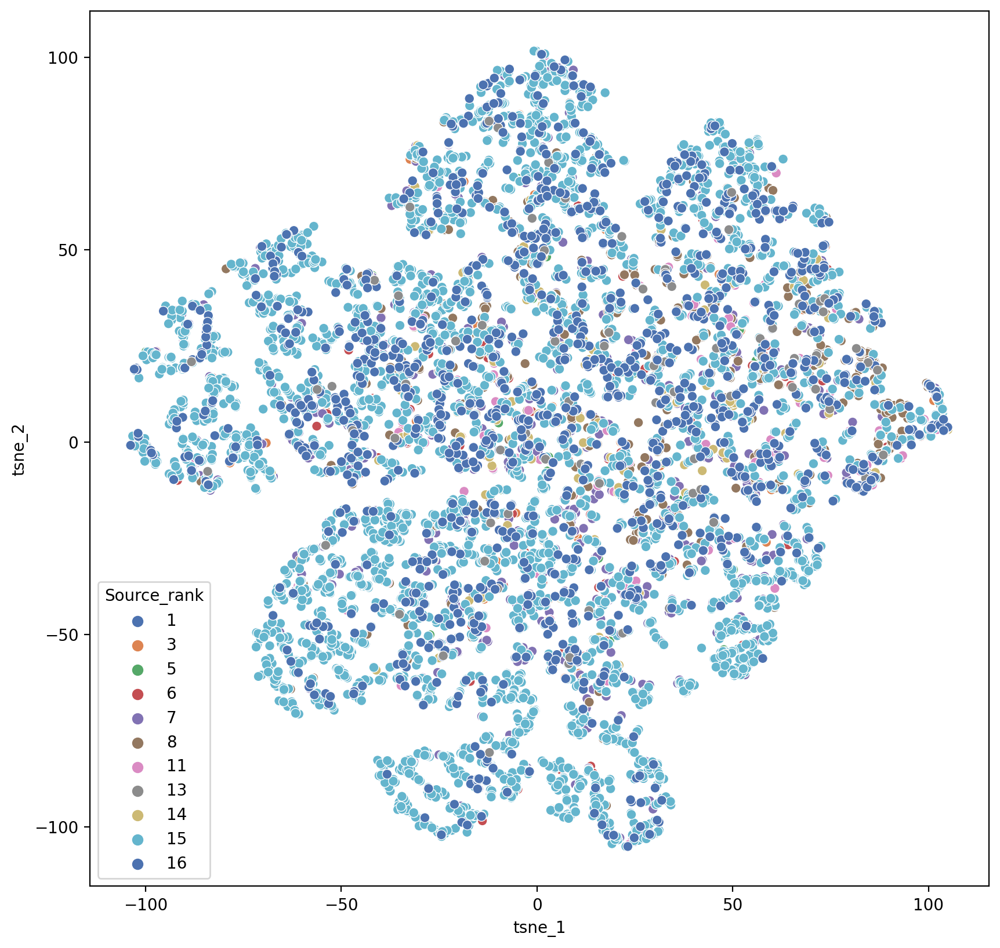

In [26]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", hue="Source_rank", palette="deep")

In [27]:
df=df[["smiles_r", "Data", "DILI", "Source_rank", "PC1","PC2","tsne_1","tsne_2", "TOXICITY"]]
df

,smiles_r,Data,DILI,Source_rank,PC1,PC2,tsne_1,tsne_2,TOXICITY
0,CN(Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,LivTox,NaN,3,-1.516772,1.418011,20.492050,-59.030979,1
1,COc1cc2c(cc1OC)CC(=O)N(CCCN(C)CC1Cc3cc(OC)c(OC...,LivTox,NaN,3,0.725520,1.462177,7.754131,-12.622993,1
2,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,LivTox,NaN,3,1.079744,0.478367,29.547396,19.623018,1
3,CNc1ccccc1,LivTox,NaN,3,-1.741754,-0.842726,-92.300819,19.262539,1
4,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2N1,LivTox,NaN,3,0.567576,-1.091842,37.820980,55.670822,1
...,...,...,...,...,...,...,...,...,...
13239,ClC1C(Cl)C(Cl)C(Cl)C(Cl)C1Cl,DILI,Held-out,1,-1.929926,0.246965,24.702019,-76.591011,0
13240,Oc1c(C2=CCC(c3ccc(Cl)cc3)CC2)c(O)c2ccccc2c1O,DILI,Held-out,1,-0.040100,0.811411,-31.280348,54.414948,0
13241,C=Cc1ccc(S(=O)(=O)O)cc1,DILI,Held-out,1,-0.929952,-0.715839,-61.079903,34.349072,0
13242,OCC(O)c1oc(O)c(O)c1O,DILI,Held-out,1,1.229904,-2.134774,66.619820,49.039673,0


In [28]:
df.to_csv("all_compounds_13244_pca_tsne.csv", index=False)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df =pd.read_csv("all_compounds_13244_pca_tsne.csv")

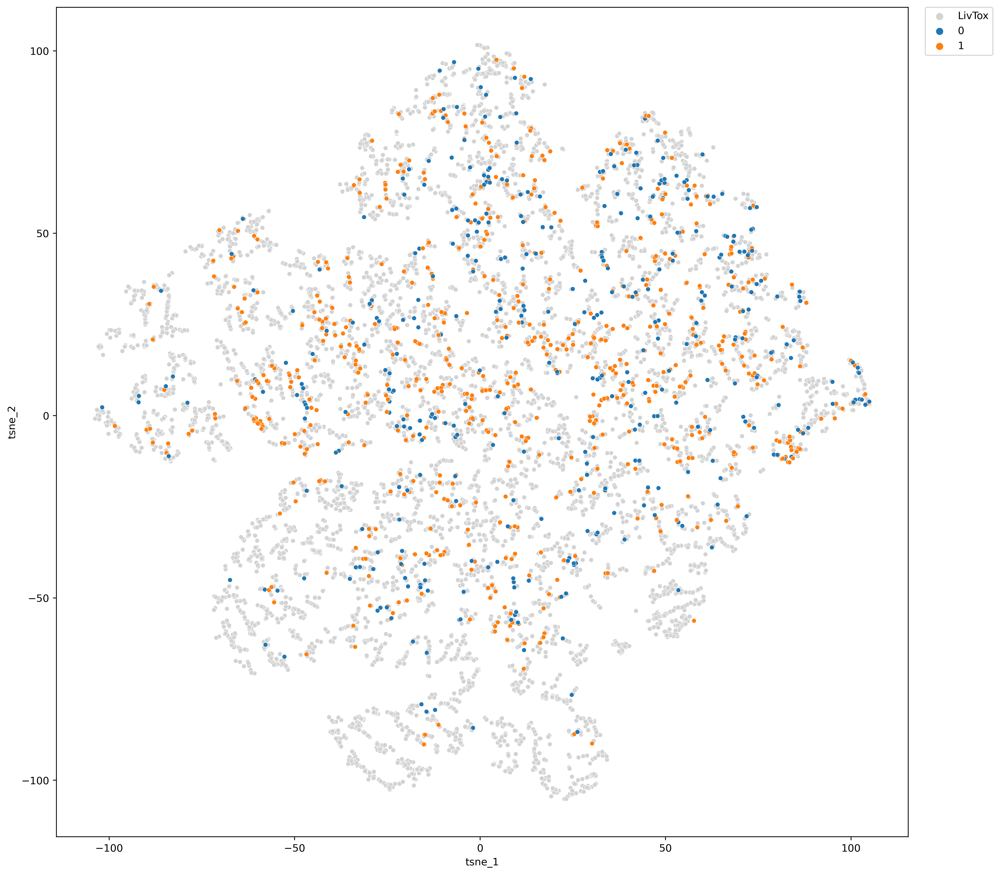

In [3]:
fig, ax = plt.subplots(figsize=(15, 15), dpi=400)
sns.scatterplot(data=df[df["Data"]=="LivTox"], x="tsne_1", y="tsne_2",palette=['lightgrey'], hue="Data",  s=20)
sns.scatterplot(data=df[df["Data"]=="DILI"], x="tsne_1", y="tsne_2", hue="TOXICITY", s=20)
plt.title("")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [4]:
df

,smiles_r,Data,DILI,Source_rank,PC1,PC2,tsne_1,tsne_2,TOXICITY
0,CN(Cc1ccc(C(C)(C)C)cc1)Cc1cccc2ccccc12,LivTox,NaN,3,-1.516772,1.418011,20.492050,-59.030980,1
1,COc1cc2c(cc1OC)CC(=O)N(CCCN(C)CC1Cc3cc(OC)c(OC...,LivTox,NaN,3,0.725520,1.462177,7.754131,-12.622993,1
2,CC(C)(C)CC(=O)OCC(=O)C1(O)CCC2C3CC=C4CC(=O)C=C...,LivTox,NaN,3,1.079744,0.478367,29.547396,19.623018,1
3,CNc1ccccc1,LivTox,NaN,3,-1.741754,-0.842726,-92.300820,19.262539,1
4,CCC1NC(=O)c2cc(S(N)(=O)=O)c(Cl)cc2N1,LivTox,NaN,3,0.567576,-1.091842,37.820980,55.670822,1
...,...,...,...,...,...,...,...,...,...
13239,ClC1C(Cl)C(Cl)C(Cl)C(Cl)C1Cl,DILI,Held-out,1,-1.929926,0.246965,24.702019,-76.591010,0
13240,Oc1c(C2=CCC(c3ccc(Cl)cc3)CC2)c(O)c2ccccc2c1O,DILI,Held-out,1,-0.040100,0.811411,-31.280348,54.414948,0
13241,C=Cc1ccc(S(=O)(=O)O)cc1,DILI,Held-out,1,-0.929952,-0.715839,-61.079903,34.349070,0
13242,OCC(O)c1oc(O)c(O)c1O,DILI,Held-out,1,1.229904,-2.134774,66.619820,49.039673,0


In [11]:
df.DILI.value_counts()

NCV         888
Held-out    223
Name: DILI, dtype: int64

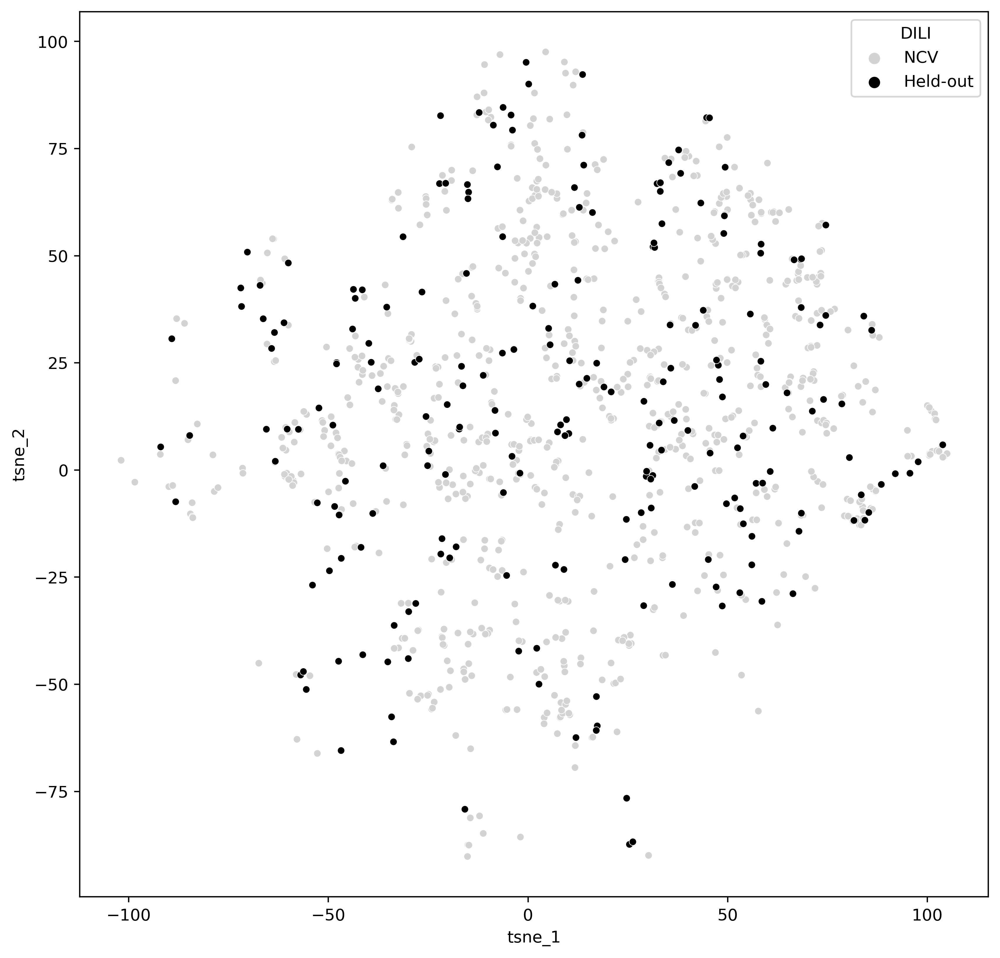

In [5]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=400)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", palette=['lightgrey', "black"], hue="DILI",  s=20)
plt.title("")
plt.show()

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/seaborn/relational.py:644: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  points = ax.scatter(*args, **kws)


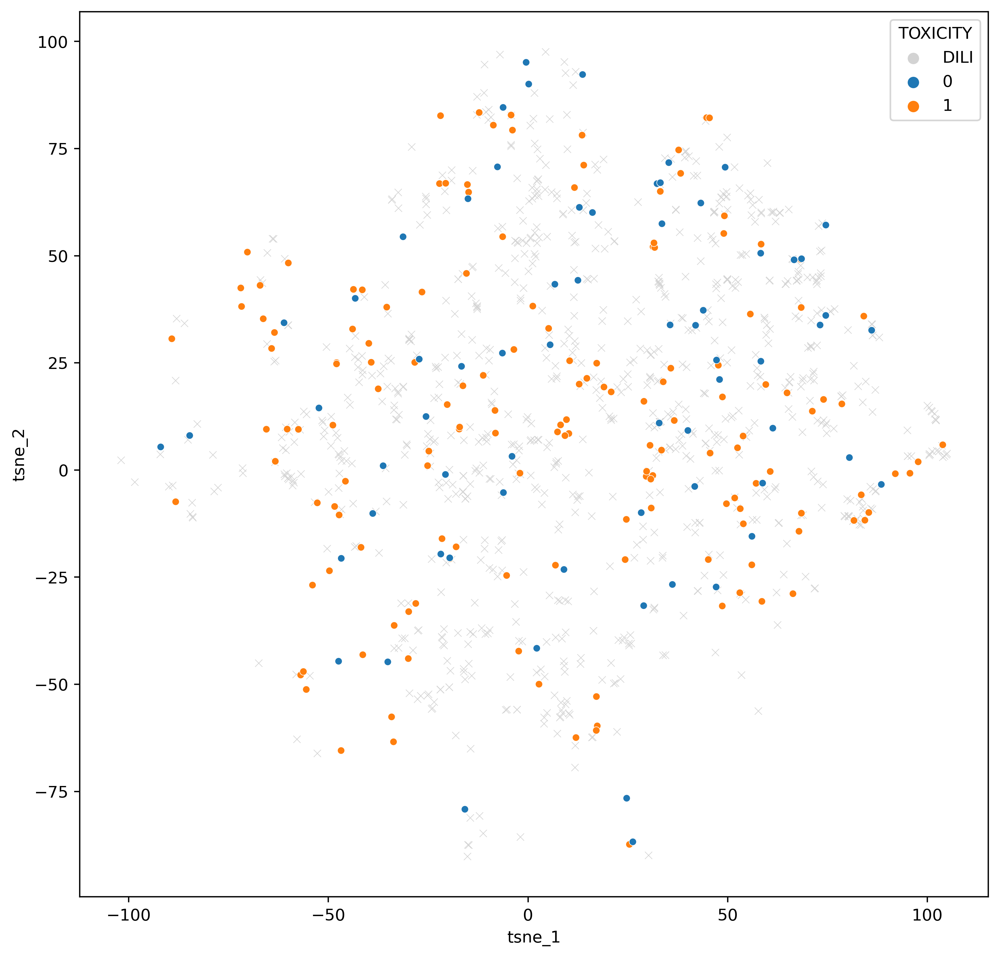

In [6]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=400)
sns.scatterplot(data=df[df["DILI"]=="NCV"], x="tsne_1", y="tsne_2", palette=['lightgrey'], hue="Data",  s=20, marker="x")
sns.scatterplot(data=df[df["DILI"]=="Held-out"], x="tsne_1", y="tsne_2", hue="TOXICITY", s=20)
plt.title("")
plt.show()

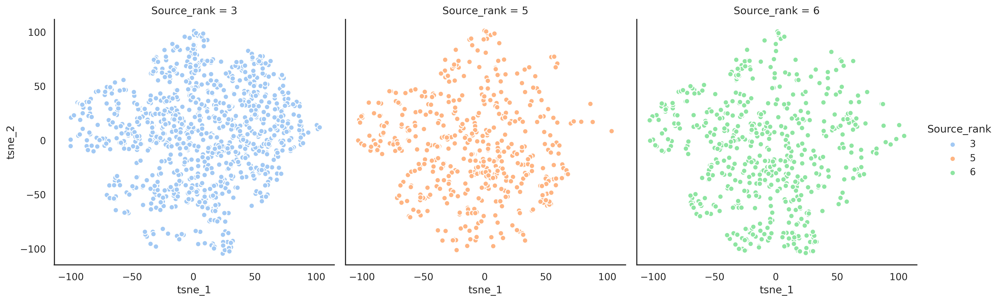

In [7]:
sns.set_theme(style='white', 
              palette='pastel', rc={'figure.dpi': 300, 'figure.figsize': (5, 3.75)})
graph = sns.FacetGrid(df[df.Source_rank.isin([3, 5, 6])], col ="Source_rank", hue="Source_rank", height=5, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()

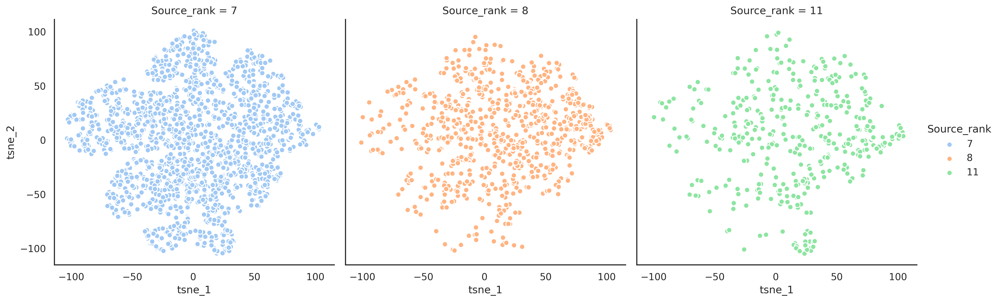

In [8]:
# Form a facetgrid using columns with a hue
graph = sns.FacetGrid(df[df.Source_rank.isin([7, 8, 11])], col ="Source_rank", hue="Source_rank", height=5, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()

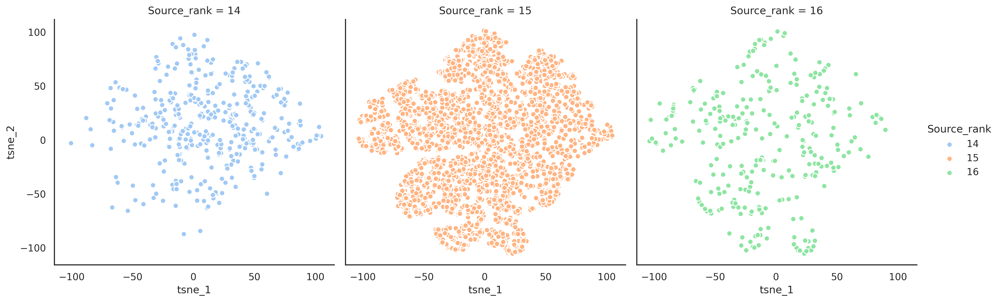

In [9]:
# Form a facetgrid using columns with a hue
graph = sns.FacetGrid(df[df.Source_rank.isin([14, 15, 16])], col ="Source_rank", hue="Source_rank", height=5, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()

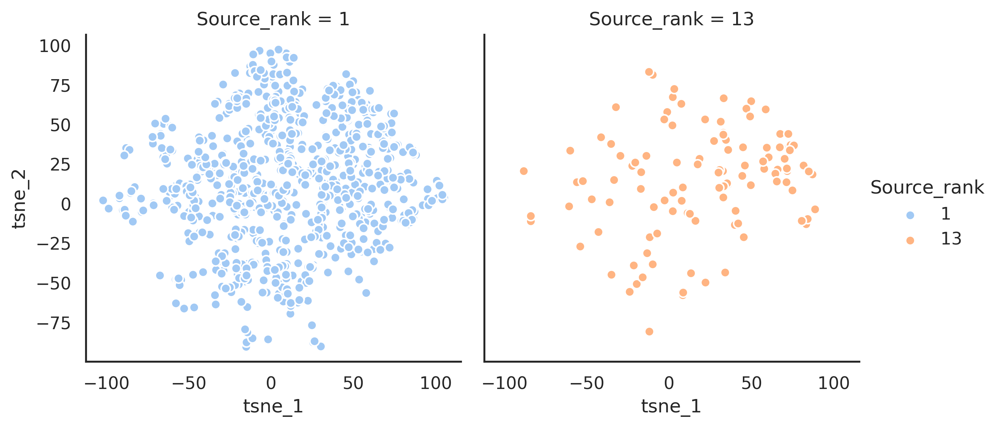

In [10]:
# Form a facetgrid using columns with a hue
graph = sns.FacetGrid(df[df.Source_rank.isin([1, 13])], col ="Source_rank", hue="Source_rank", height=4, aspect=1)
# map the above form facetgrid with some attributes
graph.map(plt.scatter, "tsne_1", "tsne_2", edgecolor ="w").add_legend()